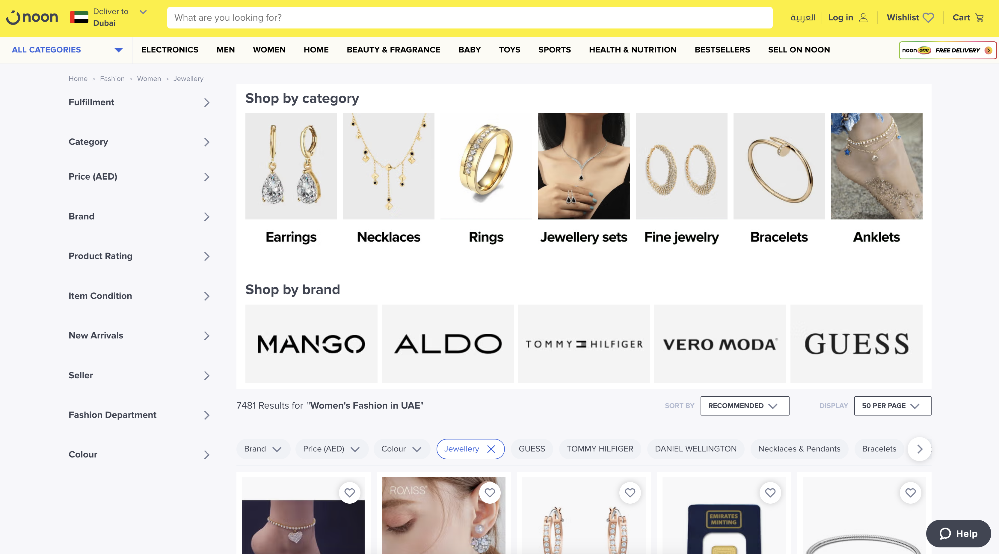


----------

<h1 align="center"> Noon Jewellery Web Scraping: Product and Price Analysis Using Python </h1>
<br>
<center align="left"> <font size='4'>  Developed by: </font><font size='4' color='#FF9900'>Wei Cheng </font></center>
<br>

----------

## What is Noon?

[Noon.com](https://www.noon.com/uae-en/fashion/women-31229/womens-jewellery/fashion-women/) is a prominent e-commerce platform based in the Middle East, providing a diverse range of products, including electronics, fashion, beauty, home, and kitchen items. This web scraping project focuses on the jewelry category, one of the extensive product categories offered by Noon. Through this project, users aim to gather valuable insights, track pricing trends, or extract specific information related to jewelry available on the Noon platform.

## Webscraping

Use Python libraries [resquests](https://docs.python-requests.org/projects/requests-html/en/latest/) and [BeautifulSoup](https://www.crummy.com/software/BeautifulSoup/bs4/doc/) to fetch,parse and extract information needed from the wab page.

The products on jewellery page got 149 pages, with totally 7480 results by the date of January 31.

### Install and Import Libraries



In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import datetime
import re
%matplotlib inline

### Getting a Page

I am using the `requests` library to make a request to web and get the page contents, and then using Beautifulsoup to parse the returned html.

In [2]:
baseurl = 'https://www.noon.com/'

In [29]:
url = 'https://www.noon.com/fashion/women-31229/womens-jewellery/fashion-women/?limit=50&page=1'

In [181]:
HEADERS =({"User-Agent":"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36", \
          "Accept-Language":"en-US, en;q=0.5"})

In [31]:
r = requests.get(url, headers = HEADERS)

### Request Status

The `.status_code` property is use to check if the response was successful.
A successfull response will have the [HTTP response](https://developer.mozilla.org/en-US/docs/Web/HTTP/Status) code in between 200 and 299

In [32]:
r.status_code

200

### Get the page content



In [396]:
soup = BeautifulSoup(r.content)
soup

<!DOCTYPE html>
<html data-commit="64f32" data-version="v3.9.98" dir="ltr" lang="en-AE"><head><meta charset="utf-8"/><style>
    html, body, div, span, applet, object, iframe,
    h1, h2, h3, h4, h5, h6, p, blockquote, pre,
    a, abbr, acronym, address, big, cite, code,
    del, dfn, em, img, ins, kbd, q, s, samp,
    small, strike, strong, sub, sup, tt, var,
    b, u, i, center,
    dl, dt, dd, ol, ul, li,
    fieldset, form, label, legend,
    table, caption, tbody, tfoot, thead, tr, th, td,
    article, aside, canvas, details, embed,
    figure, figcaption, footer, header, hgroup,
    menu, nav, output, ruby, section, summary,
    time, mark, audio, video {
        margin: 0;
        padding: 0;
        border: 0;
        font-size: 100%;
        font: inherit;
        vertical-align: baseline;
        box-sizing: border-box;
    }

    article, aside, details, figcaption, figure,
    footer, header, hgroup, menu, nav, section {
        display: block;
    }

    ol, ul {
        l

In [51]:
spans = soup.find('div', class_ = 'sc-926ab76d-7 eCDCTP grid')
spans

<div class="sc-926ab76d-7 eCDCTP grid"><span class="sc-deebe925-0 fEembb wrapper productContainer show"><a href="/uae-en/stainless-steel-bracelet/Z41A0FF194384E62AD715Z/p/?o=z41a0ff194384e62ad715z-1" id="productBox-Z41A0FF194384E62AD715Z"><div class="sc-901298d2-0 iWdiZf grid"><div class="sc-a080589e-0 cGHvwC"><div class="sc-a080589e-1 beMEfh"><div data-qa="productImagePLP_Stainless Steel Bracelet "><div class="sc-8aa199cf-0 cXXinA"><div class="sc-8aa199cf-4 fLkTPR"><div class="sc-a080589e-3 cvzBQu"><div class="sc-a080589e-9 nbdnj"><div class="sc-a080589e-10 fEgaHz"></div></div><div class="sc-a080589e-11 fdgIwM"><button class="sc-a080589e-13 iqqhes" type="button"><img alt="wishlist" class="sc-e5b054ec-1 lpdxQT" height="30px" src="https://f.nooncdn.com/s/app/com/noon/icons/wishlist.svg" width="30px"/></button></div><div class="sc-ff788cb7-0 HjBln"><div class="sc-ff788cb7-1 ebdjJq"><img alt="wdt-icon" class="sc-e5b054ec-1 ejhbvO" src="https://f.nooncdn.com/s/app/com/noon/icons/returns-de

In [63]:
for span in spans:
    links = span.find_all('a')
    for link in links:
        productlinks = baseurl + link['href']
        print(productlinks)
      

https://www.noon.com//uae-en/stainless-steel-bracelet/Z41A0FF194384E62AD715Z/p/?o=z41a0ff194384e62ad715z-1
https://www.noon.com//uae-en/heart-ankle-bracelets-for-women-sliver-rhinestone-tennis-chain-love-heart-ankle-boho-foot-chain-bracelet-crystal-tennis-anklet-bracelet-beach-jewelry-gifts/Z39481BB8860A8FA033D1Z/p/?o=z39481bb8860a8fa033d1z-1
https://www.noon.com//uae-en/pandora-jewelry-family-forever-safety-chain-sterling-silver-charm/Z0E4612C1DB1D0B799747Z/p/?o=z0e4612c1db1d0b799747z-1
https://www.noon.com//uae-en/alloy-floral-ring/N36268019A/p/?o=d6b357a42b162d8e
https://www.noon.com//uae-en/anklet-with-heart-detail/Z4B5CFCFE235B2B3960ADZ/p/?o=z4b5cfcfe235b2b3960adz-1
https://www.noon.com//uae-en/stone-studded-metal-anklet/N22503255A/p/?o=d4a1cb3d86c0bd2d
https://www.noon.com//uae-en/8g-gold-coin-with-burj-khalifa-uae-heritage-building-design-8-grams-24kt-999-9-purity/ZEAAFE5C29EB60AEAF36DZ/p/?o=zeaafe5c29eb60aeaf36dz-1
https://www.noon.com//uae-en/10g-gold-coin-with-burj-khalifa-ua

In [67]:
product_links = []
for x in range(1, 150):
    r = requests.get(f'https://www.noon.com/fashion/women-31229/womens-jewellery/fashion-women/?limit=50&page={x}', headers = HEADERS)
    soup = BeautifulSoup(r.content)
    spans = soup.find('div', class_ = 'sc-926ab76d-7 eCDCTP grid')
    for span in spans:
        links = span.find_all('a')
        for link in links:
            productlinks = baseurl + link['href']
            product_links.append(productlinks)

In [68]:
len(product_links)

7450

In [70]:
product_links

['https://www.noon.com//uae-en/stainless-steel-bracelet/Z41A0FF194384E62AD715Z/p/?o=z41a0ff194384e62ad715z-1',
 'https://www.noon.com//uae-en/heart-ankle-bracelets-for-women-sliver-rhinestone-tennis-chain-love-heart-ankle-boho-foot-chain-bracelet-crystal-tennis-anklet-bracelet-beach-jewelry-gifts/Z39481BB8860A8FA033D1Z/p/?o=z39481bb8860a8fa033d1z-1',
 'https://www.noon.com//uae-en/pandora-jewelry-family-forever-safety-chain-sterling-silver-charm/Z0E4612C1DB1D0B799747Z/p/?o=z0e4612c1db1d0b799747z-1',
 'https://www.noon.com//uae-en/alloy-floral-ring/N36268019A/p/?o=d6b357a42b162d8e',
 'https://www.noon.com//uae-en/anklet-with-heart-detail/Z4B5CFCFE235B2B3960ADZ/p/?o=z4b5cfcfe235b2b3960adz-1',
 'https://www.noon.com//uae-en/stone-studded-metal-anklet/N22503255A/p/?o=d4a1cb3d86c0bd2d',
 'https://www.noon.com//uae-en/8g-gold-coin-with-burj-khalifa-uae-heritage-building-design-8-grams-24kt-999-9-purity/ZEAAFE5C29EB60AEAF36DZ/p/?o=zeaafe5c29eb60aeaf36dz-1',
 'https://www.noon.com//uae-en/10g-

###  Extract Information Data from Each Page



In [180]:
testlink = 'https://www.noon.com/uae-en/stainless-steel-bracelet/Z41A0FF194384E62AD715Z/p/?o=z41a0ff194384e62ad715z-1'
r = requests.get(testlink, headers = HEADERS)
soup = BeautifulSoup(r.content)


In [100]:
name = soup.find('h1', class_ = 'sc-fe105d6c-18 hgXzCs').text.strip()
print(name)

Stainless Steel Bracelet


In [78]:
brand = soup.find('div', class_ = 'sc-fe105d6c-17 jWmzRz').text.strip()
print(brand)

POLICE


In [202]:
sales_price = soup.find('div', class_ = 'priceNow').text.strip().split('\xa0')[1]
print(sales_price)

9.00


In [198]:
currency = soup.find('div', class_ = 'priceNow').text.strip().split('\xa0')[0]
print(currency)

AED


In [195]:
orig_price = soup.find('div', class_ = 'priceWas').text.strip().split(' ')[1]
print(orig_price)

23.45


In [179]:
soup.find('div', class_='priceWas')

In [176]:
rating = soup.find('span', class_ = 'sc-fb51bf29-1 kjfyFW').text.strip()
rating

'4.4'

In [119]:
product_id = re.search(r'/([^/]+)/p/\?o=', testlink).group(1)
product_id

'Z41A0FF194384E62AD715Z'

In [130]:
category = soup.find('div', class_='sc-54ed93c4-2 ijtKtO').find_all('a')[-1].text.strip()
print(category)

Bracelets


In [197]:
discount_percentage = soup.find('span', class_ = 'profit').text.strip().replace(' Off', '')
discount_percentage

'6%'

In [158]:
product_link = testlink
product_link

'https://www.noon.com/uae-en/stainless-steel-bracelet/Z41A0FF194384E62AD715Z/p/?o=z41a0ff194384e62ad715z-1'

### Combine Extracted Data into Python Dictionary

In [199]:
productlist = []
for links in product_links:
    r = requests.get(links, headers = HEADERS)
    soup = BeautifulSoup(r.content)
    try:
        name = soup.find('h1', class_ = 'sc-fe105d6c-18 hgXzCs').text.strip()
    except: 
        name = 'None'
    try:
        brand = soup.find('div', class_ = 'sc-fe105d6c-17 jWmzRz').text.strip()
    except: 
        brand = 'None'
    try:
        sales_price = soup.find('div', class_ = 'priceNow').text.strip().split('\xa0')[1]
    except: 
        sales_price = 'None'
    try:
        orig_price = soup.find('div', class_ = 'priceWas').text.strip().split(' ')[1]
    except: 
        orig_price = 'None'
    try:
        rating = soup.find('span', class_ = 'sc-fb51bf29-1 kjfyFW').text.strip()
    except: 
        rating = 'None'
    try:
        product_id = re.search(r'/([^/]+)/p/\?o=', links).group(1)
    except: 
        product_id = 'None'
    try:
        category = soup.find('div', class_='sc-54ed93c4-2 ijtKtO').find_all('a')[-1].text.strip()
    except: 
        category = 'None'
    try:
        discount_percentage = soup.find('span', class_ = 'profit').text.strip().replace(' Off', '')
    except: 
        discount_percentage = 'None'
    try:
        product_link = links
    except: 
        product_link = 'None'
    try:
        currency = sales_price = soup.find('div', class_ = 'priceNow').text.strip().split('\xa0')[0]
    except: 
        currency = 'None'

    noondata = {
        'product_id' : product_id,
        'product_name' : name,
        'category': category,
        'currency' : currency,
        'discounted_price' : sales_price,
        'actual_price' : orig_price,
        'discount_percentage' : discount_percentage,
        'rating' : rating,
        'product_link' : product_link,
        'brand' : brand
        }
    productlist.append(noondata)
    print('Saving: ', noondata['product_name'])
    

Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Neckl

Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Buildi

Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets 

Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Cha

Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+E

Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love C

Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Savin

Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet

Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Sav

Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving: 

Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure 

Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Stu

Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Ea

Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Sav

Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving: 

Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure 

Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Stu

Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess

Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  None
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  None
Saving:  Pearl Necklace


Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving: 

Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure 

Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Go

Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry C

Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equi

Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earring

Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085


Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy F

Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  H

Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoo

Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earring

Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Sa

Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With

Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Savin

Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  None
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Tw

Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earring

Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085


Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  Hamsa Hand Bracelet
Saving:  Adreanna Necklace
Saving:  Iveess Croc Effect Zipped Jewelry Case
Saving:  Acrylic Geometric Stud Earrings
Saving:  Pearl Stud Earrings
Saving:  Stainless Steel Bracelet
Saving:  Heart Ankle Bracelets for Women Sliver Rhinestone Tennis Chain Love Heart Ankle Boho Foot Chain Bracelet Crystal Tennis Anklet Bracelet Beach Jewelry Gifts
Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy F

Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equilibre Cuff Bracelet
Saving:  Pearl Necklace
Saving:  Layered Pendant Necklace
Saving:  Crystal Pendant Necklace
Saving:  Heart Pendant Necklace
Saving:  Chain Detailed Bracelet
Saving:  2 Pack Beaded Anklet Set
Saving:  Chain Detailed Stud Earrings
Saving:  14-Piece Zinc Alloy Ring Set
Saving:  Graceful Four Leaf Clover Design Earrings
Saving:  H

Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earrings
Saving:  Triangle Stud Earrings
Saving:  Dainty Layered Necklace
Saving:  Layered Mix Chain Necklace
Saving:  Round Stud Earrings
Saving:  Hadeya Crystal Heart Necklace+Earrings Set
Saving:  3 Pack Beaded Chain Anklet Set
Saving:  Triple Mini Hoop Earrings
Saving:  Pave Huggies Earrings
Saving:  Circular Drop Earrings
Saving:  Heart Pendant Necklace
Saving:  Pearl Hoop Earrings
Saving:  Twisted Single Ring
Saving:  Logo Detailed Bracelet
Saving:  Equi

Saving:  PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm
Saving:  Alloy Floral Ring
Saving:  Anklet With Heart Detail
Saving:  Stone Studded Metal Anklet
Saving:  8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity
Saving:  10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity
Saving:  PANDORA Jewelry Happy Birthday Balloon Charm Sterling Silver Cubic Zirconia
Saving:  Infinity Ring
Saving:  Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085
Saving:  Layered Mix Chain Necklace
Saving:  Clemina Hinge Metallic Bangle
Saving:  Pure Copper Energy Magnetic Cuff Bracelet
Saving:  Pandora Moments Glittery White Murano Glass Mum and Love Charm for Women's Bangle 792655C00
Saving:  Layered Heart Pendant Necklace
Saving:  Fossatillo Set
Saving:  Single Heart Chain Necklace
Saving:  Round Stud Earrings
Saving:  Stars Hoop Earrings
Saving:  Layered Pearl Chain Necklace
Saving:  Triple Geometric Drop Earring

In [399]:
len(productlist)

7450

149 pages and 7450 products are successfully parsed

In [421]:
df = pd.DataFrame(productlist)
df.to_csv('Noondata.csv', index = None)
df.shape

(7450, 10)

In [422]:
df.head()

,product_id,product_name,category,currency,discounted_price,actual_price,discount_percentage,rating,product_link,brand
0,Z41A0FF194384E62AD715Z,Stainless Steel Bracelet,Bracelets,AED,AED,232.00,50%,4.0,https://www.noon.com//uae-en/stainless-steel-b...,POLICE
1,Z39481BB8860A8FA033D1Z,Heart Ankle Bracelets for Women Sliver Rhinest...,Anklets,AED,AED,None,None,4.4,https://www.noon.com//uae-en/heart-ankle-brace...,Depend
2,Z0E4612C1DB1D0B799747Z,PANDORA Jewelry Family Forever Safety Chain St...,Charms,AED,AED,228.00,62%,3.0,https://www.noon.com//uae-en/pandora-jewelry-f...,PANDORA
3,N36268019A,Alloy Floral Ring,Rings,AED,AED,23.45,6%,None,https://www.noon.com//uae-en/alloy-floral-ring...,Beauenty
4,Z4B5CFCFE235B2B3960ADZ,Anklet With Heart Detail,Anklets,AED,AED,39.00,61%,4.0,https://www.noon.com//uae-en/anklet-with-heart...,Ginger


## Data Understanding

As an overview, this dataset has the data of 7K+ Noon jewellery product prices and product details as per their details listed on the official website of Noon.



### Import the modules/libraries that needed to notebook and read the dataset

In [2]:
import numpy as np
import pandas as pd
import math
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
import urllib.request

In [3]:
df = pd.read_csv('Noondata.csv')
df.head()

,product_id,product_name,category,currency,discounted_price,actual_price,discount_percentage,rating,product_link,brand
0,Z41A0FF194384E62AD715Z,Stainless Steel Bracelet,Bracelets,AED,AED,232.00,50%,4.0,https://www.noon.com//uae-en/stainless-steel-b...,POLICE
1,Z39481BB8860A8FA033D1Z,Heart Ankle Bracelets for Women Sliver Rhinest...,Anklets,AED,AED,NaN,NaN,4.4,https://www.noon.com//uae-en/heart-ankle-brace...,Depend
2,Z0E4612C1DB1D0B799747Z,PANDORA Jewelry Family Forever Safety Chain St...,Charms,AED,AED,228.00,62%,3.0,https://www.noon.com//uae-en/pandora-jewelry-f...,PANDORA
3,N36268019A,Alloy Floral Ring,Rings,AED,AED,23.45,6%,NaN,https://www.noon.com//uae-en/alloy-floral-ring...,Beauenty
4,Z4B5CFCFE235B2B3960ADZ,Anklet With Heart Detail,Anklets,AED,AED,39.00,61%,4.0,https://www.noon.com//uae-en/anklet-with-heart...,Ginger


#### Features:

* product_id — Product ID - product_id

* product_name — Name of the Product - name

* category — Category of the product - category

* discounted_price — The discounted price of the product - sales_price

* actual_price — Actual price of the product - orig_price

* discount_percentage — Percentage of discount for the product - discount_percentage

* rating — Rating of the product - rating - rating

* product_link — Official website link of the product - product_link

* currency

* brand

 ### Check the data type of each column and fix the columns.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7450 entries, 0 to 7449
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   product_id           7450 non-null   object 
 1   product_name         7424 non-null   object 
 2   category             7424 non-null   object 
 3   currency             7424 non-null   object 
 4   discounted_price     7424 non-null   object 
 5   actual_price         6978 non-null   float64
 6   discount_percentage  6829 non-null   object 
 7   rating               6980 non-null   float64
 8   product_link         7450 non-null   object 
 9   brand                7424 non-null   object 
dtypes: float64(2), object(8)
memory usage: 582.2+ KB


In [5]:
df["product_link"] = df["product_link"].astype("string")

In [6]:
#Removing white spaces from 'product_id' column
df['product_id'] = df['product_id'].str.strip()

In [7]:
df.head()

,product_id,product_name,category,currency,discounted_price,actual_price,discount_percentage,rating,product_link,brand
0,Z41A0FF194384E62AD715Z,Stainless Steel Bracelet,Bracelets,AED,AED,232.00,50%,4.0,https://www.noon.com//uae-en/stainless-steel-b...,POLICE
1,Z39481BB8860A8FA033D1Z,Heart Ankle Bracelets for Women Sliver Rhinest...,Anklets,AED,AED,NaN,NaN,4.4,https://www.noon.com//uae-en/heart-ankle-brace...,Depend
2,Z0E4612C1DB1D0B799747Z,PANDORA Jewelry Family Forever Safety Chain St...,Charms,AED,AED,228.00,62%,3.0,https://www.noon.com//uae-en/pandora-jewelry-f...,PANDORA
3,N36268019A,Alloy Floral Ring,Rings,AED,AED,23.45,6%,NaN,https://www.noon.com//uae-en/alloy-floral-ring...,Beauenty
4,Z4B5CFCFE235B2B3960ADZ,Anklet With Heart Detail,Anklets,AED,AED,39.00,61%,4.0,https://www.noon.com//uae-en/anklet-with-heart...,Ginger


## Data Cleaning & Preparation

Cleansing the dataset and tidying up, so that the dataset is ready to be explored.

In [8]:
df = pd.read_csv('Noondata.csv')
df.head()

,product_id,product_name,category,currency,discounted_price,actual_price,discount_percentage,rating,product_link,brand
0,Z41A0FF194384E62AD715Z,Stainless Steel Bracelet,Bracelets,AED,AED,232.00,50%,4.0,https://www.noon.com//uae-en/stainless-steel-b...,POLICE
1,Z39481BB8860A8FA033D1Z,Heart Ankle Bracelets for Women Sliver Rhinest...,Anklets,AED,AED,NaN,NaN,4.4,https://www.noon.com//uae-en/heart-ankle-brace...,Depend
2,Z0E4612C1DB1D0B799747Z,PANDORA Jewelry Family Forever Safety Chain St...,Charms,AED,AED,228.00,62%,3.0,https://www.noon.com//uae-en/pandora-jewelry-f...,PANDORA
3,N36268019A,Alloy Floral Ring,Rings,AED,AED,23.45,6%,NaN,https://www.noon.com//uae-en/alloy-floral-ring...,Beauenty
4,Z4B5CFCFE235B2B3960ADZ,Anklet With Heart Detail,Anklets,AED,AED,39.00,61%,4.0,https://www.noon.com//uae-en/anklet-with-heart...,Ginger


In [9]:
df_copy = df.copy()

In [10]:
df_copy.head()

,product_id,product_name,category,currency,discounted_price,actual_price,discount_percentage,rating,product_link,brand
0,Z41A0FF194384E62AD715Z,Stainless Steel Bracelet,Bracelets,AED,AED,232.00,50%,4.0,https://www.noon.com//uae-en/stainless-steel-b...,POLICE
1,Z39481BB8860A8FA033D1Z,Heart Ankle Bracelets for Women Sliver Rhinest...,Anklets,AED,AED,NaN,NaN,4.4,https://www.noon.com//uae-en/heart-ankle-brace...,Depend
2,Z0E4612C1DB1D0B799747Z,PANDORA Jewelry Family Forever Safety Chain St...,Charms,AED,AED,228.00,62%,3.0,https://www.noon.com//uae-en/pandora-jewelry-f...,PANDORA
3,N36268019A,Alloy Floral Ring,Rings,AED,AED,23.45,6%,NaN,https://www.noon.com//uae-en/alloy-floral-ring...,Beauenty
4,Z4B5CFCFE235B2B3960ADZ,Anklet With Heart Detail,Anklets,AED,AED,39.00,61%,4.0,https://www.noon.com//uae-en/anklet-with-heart...,Ginger


In [11]:
df_copy.dropna(inplace=True)

In [12]:
#Checking the missing value 
df_copy.isna().sum()

product_id             0
product_name           0
category               0
currency               0
discounted_price       0
actual_price           0
discount_percentage    0
rating                 0
product_link           0
brand                  0
dtype: int64

In [13]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6534 entries, 0 to 7449
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   product_id           6534 non-null   object 
 1   product_name         6534 non-null   object 
 2   category             6534 non-null   object 
 3   currency             6534 non-null   object 
 4   discounted_price     6534 non-null   object 
 5   actual_price         6534 non-null   float64
 6   discount_percentage  6534 non-null   object 
 7   rating               6534 non-null   float64
 8   product_link         6534 non-null   object 
 9   brand                6534 non-null   object 
dtypes: float64(2), object(8)
memory usage: 561.5+ KB


In [14]:
df_copy["discount_percentage"] = df_copy["discount_percentage"].str.replace("%", "")

In [15]:
df_copy.head()

,product_id,product_name,category,currency,discounted_price,actual_price,discount_percentage,rating,product_link,brand
0,Z41A0FF194384E62AD715Z,Stainless Steel Bracelet,Bracelets,AED,AED,232.0,50,4.0,https://www.noon.com//uae-en/stainless-steel-b...,POLICE
2,Z0E4612C1DB1D0B799747Z,PANDORA Jewelry Family Forever Safety Chain St...,Charms,AED,AED,228.0,62,3.0,https://www.noon.com//uae-en/pandora-jewelry-f...,PANDORA
4,Z4B5CFCFE235B2B3960ADZ,Anklet With Heart Detail,Anklets,AED,AED,39.0,61,4.0,https://www.noon.com//uae-en/anklet-with-heart...,Ginger
6,ZEAAFE5C29EB60AEAF36DZ,8g Gold Coin with Burj Khalifa & UAE Heritage ...,Gold Coins,AED,AED,3538.0,38,4.5,https://www.noon.com//uae-en/8g-gold-coin-with...,FK Jewellers
7,ZB78EE26815FF00F4D9D1Z,10g Gold Coin with Burj Khalifa & UAE Heritage...,Gold Coins,AED,AED,4998.0,46,4.5,https://www.noon.com//uae-en/10g-gold-coin-wit...,FK Jewellers


In [16]:
df_copy['actual_price'] = pd.to_numeric(df_copy['actual_price'], errors='coerce')


In [17]:
df_copy['discount_percentage'] = pd.to_numeric(df_copy['discount_percentage'], errors='coerce')


In [18]:
# Calculate discounted_price
df_copy['discounted_price'] = df_copy['actual_price'] * (1 - df_copy['discount_percentage'] / 100)

In [19]:
df_copy.head()

,product_id,product_name,category,currency,discounted_price,actual_price,discount_percentage,rating,product_link,brand
0,Z41A0FF194384E62AD715Z,Stainless Steel Bracelet,Bracelets,AED,116.00,232.0,50,4.0,https://www.noon.com//uae-en/stainless-steel-b...,POLICE
2,Z0E4612C1DB1D0B799747Z,PANDORA Jewelry Family Forever Safety Chain St...,Charms,AED,86.64,228.0,62,3.0,https://www.noon.com//uae-en/pandora-jewelry-f...,PANDORA
4,Z4B5CFCFE235B2B3960ADZ,Anklet With Heart Detail,Anklets,AED,15.21,39.0,61,4.0,https://www.noon.com//uae-en/anklet-with-heart...,Ginger
6,ZEAAFE5C29EB60AEAF36DZ,8g Gold Coin with Burj Khalifa & UAE Heritage ...,Gold Coins,AED,2193.56,3538.0,38,4.5,https://www.noon.com//uae-en/8g-gold-coin-with...,FK Jewellers
7,ZB78EE26815FF00F4D9D1Z,10g Gold Coin with Burj Khalifa & UAE Heritage...,Gold Coins,AED,2698.92,4998.0,46,4.5,https://www.noon.com//uae-en/10g-gold-coin-wit...,FK Jewellers


In [20]:
df_copy["rating"].value_counts()

rating
4.0    5641
4.5     446
3.0     149
3.3     149
4.4     149
Name: count, dtype: int64

In [21]:
df_copy["category"].value_counts()

category
Necklaces               1783
Earrings                1781
Bracelets               1034
Anklets                  447
Rings                    447
Gold Coins               446
Jewellery Sets           298
Charms                   149
Jewellery Organizers     149
Name: count, dtype: int64

In [22]:
df_copy.isna().sum()

product_id             0
product_name           0
category               0
currency               0
discounted_price       0
actual_price           0
discount_percentage    0
rating                 0
product_link           0
brand                  0
dtype: int64

## Exploratory Data Analysis & Visualization

In this section, I will explore and analyze the cleaned dataset according to the analysis needs (an analysis of the product and price on Noon).

### Correlation Analysis

Analyze the correlation between two variables that have float data type in the dataset.

In [23]:
#Correlation between Variables
df_copy.select_dtypes(exclude=["object"])

,discounted_price,actual_price,discount_percentage,rating
0,116.00,232.0,50,4.0
2,86.64,228.0,62,3.0
4,15.21,39.0,61,4.0
6,2193.56,3538.0,38,4.5
7,2698.92,4998.0,46,4.5
...,...,...,...,...
7445,15.00,25.0,40,4.0
7446,49.50,99.0,50,4.0
7447,163.40,190.0,14,4.0
7448,9.28,29.0,68,4.0


In [24]:
fig = px.imshow(df_copy.select_dtypes(exclude=["object", "string"]).corr(), 
text_auto=True)
fig.show()

#### Insight:

The graph above shows the correlation between variables. ‘discounted_price’ has a very strong correlation with ‘actual_price’ because it has a correlation value of more than 0.9, and vice versa.

### Top-Star Products Rating

Analyze which products have a top-star rating based on the actual price (price before discount).

In [29]:
five_star_products = df_copy.query("rating == 4.5")

fig=px.bar(y=five_star_products["product_name"].str[:70], 
x=five_star_products["actual_price"])
fig.update_layout(
                  width=800,
                  height=450,
                  title="Five-Star Products Rating",
                  showlegend=False, 
                  yaxis_title=None,
                  xaxis_title="Actual Price")

fig.update_yaxes(automargin=True)
fig.show()

In [30]:
top_star_products["product_name"].tolist()[:5]

['8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity',
 '10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity',
 'Gold 5 g Coin 24KT 999.9 Purity - FKJCON24KU6085',
 '8g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 8 Grams 24KT 999.9 Purity',
 '10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity']

#### Insight:

The graph above shows the names of products that have a four-star rating based on the actual price. The highest actual price that has a top-star (4.5) rating is “10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity” with an actual price up to 4,998 AED.

### The Worst Product Rating

Analyze which product has the worst rating

In [31]:
import plotly.express as px

worst_product_rating = df_copy.query("rating == 3.0")

fig = px.bar(worst_product_rating, 
             x='actual_price', 
             y='product_name', 
             text='product_name',  
             title="Worst Rated Products (Rating = 3.0)",
             labels={'actual_price': 'Actual Price', 'product_name': 'Product Name'},
             height=450)

fig.update_layout(
    width=800,
    showlegend=False,
    xaxis_title="Actual Price",
    yaxis_title=None,
    margin=dict(l=50, r=50, b=50, t=50),
)

fig.show()


In [32]:
worst_product_rating["product_name"].tolist()[0]

'PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm'

#### Insight:

Based on the graph above: the worst product rating is “PANDORA Jewelry Family Forever Safety Chain Sterling Silver Charm” which only has a three-star rating.

### Number of Products by Category

Analyze which category has the highest number of products.

In [33]:
main_category = pd.pivot_table(df_copy[['category', 'product_id']], 
                                index=['category'], aggfunc='count')

main_category.rename(columns={"product_id": "Number_of_Products"}, inplace=True)

main_category.sort_values(by="Number_of_Products", inplace=True)

main_category


,Number_of_Products
category,
Charms,149
Jewellery Organizers,149
Jewellery Sets,298
Gold Coins,446
Anklets,447
Rings,447
Bracelets,1034
Earrings,1781
Necklaces,1783


In [34]:
main_category.reset_index(inplace=True)

df_catg = pd.DataFrame(main_category)

fig = px.bar(df_catg, x='category', y='Number_of_Products', title='Number of Products by Category-Histogram')

fig.show()


In [35]:
df_catg = pd.DataFrame(main_category)

fig = px.pie(df_catg, names='category', values='Number_of_Products', title='Number of Products by Category-Pie Chart')

fig.show()

#### Insight:

Based on the table and graph above we can conclude that the Necklaces category has the highest number of products with 1783 products in this product category.

### Product Rating Distribution by Category

Analyze the distribution of ratings in each main category.

In [36]:
df_copy.rename(columns={"category":"Main_Category"}, inplace=True)

fig = px.histogram(df_copy, x="rating", color="Main_Category", marginal="box")
fig.update_layout(title="Product Rating Distribution by Category", 
xaxis_title="Rating")
fig.show()

#### Insight:

The graph above shows the distribution of ratings in each main category. The average rating is spread out between a three-star rating and a 4.5-star rating. The Necklaces category has the most-rated products with an average product having a four-star rating.

### Product Price and Discount Percentage

Analyze which are the most expensive and cheapest products before and after the discount and analyze the average discount percentage in each category.

### Top 5 Most Expensive Products (Actual Price)

In [37]:
fig = px.bar(df_copy.sort_values('actual_price', ascending=True), 
             y="product_name", 
             x="actual_price")

fig.update_layout(width=1000,
                  height=450,
                  title="Top 5 Most Expensive Products (Actual Price)",
                  showlegend=False, 
                  yaxis_title=None)

fig.update_yaxes(automargin=True)
fig.show()


#### Insight:

Based on the graph above we can conclude that the most expensive product in the actual price is “10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity” with an actual price up to 4,998 AED.

### Top 5 Most Expensive Products ( After Discount)

In [38]:
fig = px.bar(df_copy.sort_values('discounted_price', ascending=True), 
             y="product_name", 
             x="discounted_price")
fig.update_layout(width=1000,
                  height=450,
                  title="Top 5 Most Expensive Products (Discount)",
                  showlegend=False,
                  yaxis_title=None)
fig.show()



#### Insight:

Based on the graph above we can conclude that the most expensive product after the discount is “10g Gold Coin with Burj Khalifa & UAE Heritage Building Design - 10 Grams 24KT 999.9 Purity” with the price after the discount up to 2,698.92 AED.

### Top 5 Cheapest Products (Actual Price)

In [39]:
fig = px.bar(df_copy.sort_values('actual_price', ascending=False), y="product_name", x="actual_price")

fig.update_layout(width=1000,
                  height=450,
                  title="Top 5 Cheapest Products (Actual Price)",
                  showlegend=False, 
                  yaxis_title=None)
fig.show()


#### Insight:

Based on the graph above we can conclude that the cheapest product in the actual price is “Pure Copper Energy Magbetic Cuff Bracelet” with an actual price up to 23.8 AED.

### Top 5 Cheapest Products (After Discount)



In [40]:
fig = px.bar(df_copy.sort_values('discounted_price', ascending=False), y="product_name", x="discounted_price")

fig.update_layout(width=1000,
                  height=450,
                  title="Top 5 Cheapest Products (Discount)",
                  showlegend=False, 
                  yaxis_title=None)
fig.show()

#### Insight:

Based on the graph above we can conclude that the cheapest product after the discount are “Dainty Layered Necklace", "Acrylic Geometric Stud Earrings",  "Pearl Hoop Earings", and "Pearl Stud Earings” with the price after the discount up to 9.28 AED.

### Average Discount Percentage by Category

In [41]:
discount_main_cat = pd.pivot_table(df_copy[["Main_Category", "discount_percentage"]], 
              index="Main_Category", aggfunc=np.mean).reset_index()
discount_main_cat.sort_values(by="discount_percentage", inplace=True)
discount_main_cat

,Main_Category,discount_percentage
5,Jewellery Organizers,14.000000
6,Jewellery Sets,21.000000
1,Bracelets,37.548356
3,Earrings,41.562044
4,Gold Coins,42.008969
8,Rings,47.666667
2,Charms,62.000000
7,Necklaces,64.734156
0,Anklets,66.333333


In [42]:
df_catg_dis = pd.DataFrame(discount_main_cat)

fig = px.bar(df_catg_dis, x='Main_Category', y='discount_percentage', title='Discount Percentage by Main Category')

fig.show()


In [43]:
df_category = pd.DataFrame(discount_main_cat)

fig = px.pie(df_category, names='Main_Category', values='discount_percentage', title='Discount Percentage by Main Category')

fig.show()


#### Insight:

Based on the table and graph above we can conclude that the Anklets category has the highest average discount percentage with an average discount percentage up to 66.3%.

### Linear Regression Model

Analyze the effect of the X variables (“rating”, and “actual_price”) on the Y variable (“discounted_price”).

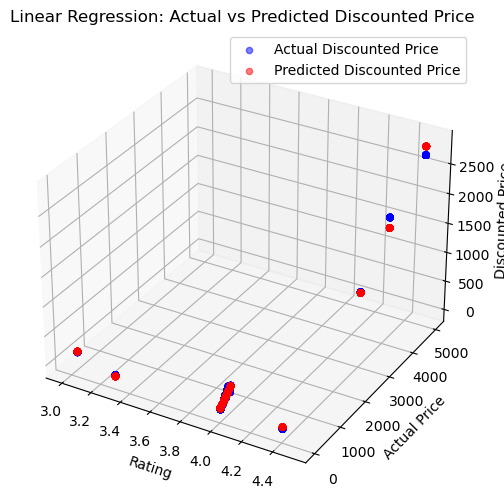

Linear Regression Intercept:  -147.5114659266099
Linear Regression Coefficient:  [39.33889026  0.56272043]
R2 Score:  0.993


In [50]:
X = df_copy [["rating", "actual_price"]]
Y = df_copy["discounted_price"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

pred = lr_model.predict(X_test)

fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_test['rating'], X_test['actual_price'], y_test, color='blue', label='Actual Discounted Price', alpha=0.5)
ax.scatter(X_test['rating'], X_test['actual_price'], pred, color='red', label='Predicted Discounted Price', alpha=0.5)

ax.set_xlabel('Rating')
ax.set_ylabel('Actual Price')
ax.set_zlabel('Discounted Price')
ax.set_title('Linear Regression: Actual vs Predicted Discounted Price')

ax.legend()
plt.show()

print('Linear Regression Intercept: ', lr_model.intercept_)
print('Linear Regression Coefficient: ', lr_model.coef_)
print('R2 Score: ', round(r2_score(y_test, pred), 3))

#### Function:

DP = -147.51 + 39.33R+ 0.56AP

#### desc:

* DP = discounted_price
* R = rating
* AP = actual_price

#### Insight:

* Intercept: -147.51 → If x variables (“rating”, and “actual_price”) are zero, then y variable (“discounted_price”) will be negative (no discount).

* 39.33R → Each increase in one-star “rating” will affect the “discounted_price” increase of 42.078, assuming other variables are constant.

* 0.56AP → Each increase in the actual price of 1 AED will affect the “discounted_price” increase of 0.562, assuming other variables are constant.

* R2: 0.993 → 99% of the variation in the “discounted_price” variable can be explained by the “rating”, and “actual_price” variables.

In [369]:
df_copy.to_csv('Noondata_cleaned.csv', index = None)

## Challenges 

I encountered several challenges during my web scraping project on Noon. 

Firstly, when attempting to scrape information from Amazon, I faced difficulties due to the rapid refresh rate of data, and I was ultimately prevented from conducting web scraping on the Amazon website. As a result, I had to switch to another website.

Secondly, while scraping the Noon website for jewelry products, I encountered issues obtaining the discounted price directly. To address this, I decided to scrape the discount rate and original price, allowing me to calculate the discounted price.

## Next Step

* Analyze the rating details, including rating counts and reviews content, to perform sentiment analysis.
* Calculate the prices in US dollars instead of AED currency.
* Analyze to retrieve items by brand: Extract information on jewelry products across diverse brands from the Noon jewelry page to find the number of products by brand, the distribution of product ratings by brand, and the average discount percentage by brand.

## References

* WeCloudData Academy
* Nelli, Fabio. (2015). Python Data Analytics: Data Analysis and Science Using Pandas, Matplotlib, and the Python Programming Language. California: Apress Media.
* https://fortune.com/company/noon-com/.
* https://plotly.com/python/plotly-express/.
* https://realpython.com/linear-regression-in-python/.
* https://scikit-learn.org/stable/modules/linear_model.html#ordinary-least-squares.

